# Visualization Tasks

In [3]:
import matplotlib.pyplot as plt
import tqdm
from skimage.feature import hog
from skimage import data, exposure
from FDDB_dataloader import FDDB
import PIL.Image as Image
import PIL.ImageDraw as ImageDraw
import torchvision.transforms as T
import numpy as np
import torch
import Model_zoo as Model
import os
# from IPython.display import display

In [4]:
os.environ["CUDA_VISIBLE_DEVICES"]="2"

In [2]:
db = FDDB('train_list.npy',crop=False, zero_one=True)

In [28]:
def vis(db, idx, save=False):
    seq = [5,3,6,2,8,0,7,1,4]
    fig1, axes = plt.subplots(3, 3, figsize=(30,30))
#     fig1.suptitle("Idx: {}".format(idx))
    for k in range(9):
        axes[k//3][k%3].imshow(db.draw_bndbox(idx,seq[k]))
        axes[k//3][k%3].axis('off')

    fig1.tight_layout()
    plt.subplots_adjust(wspace =0., hspace =0.1)
    if save:
        plt.savefig(f'VisFig/{idx:04d}.png')
    plt.show()
    plt.close()
    

## Visualize bounding box of pos and neg samples

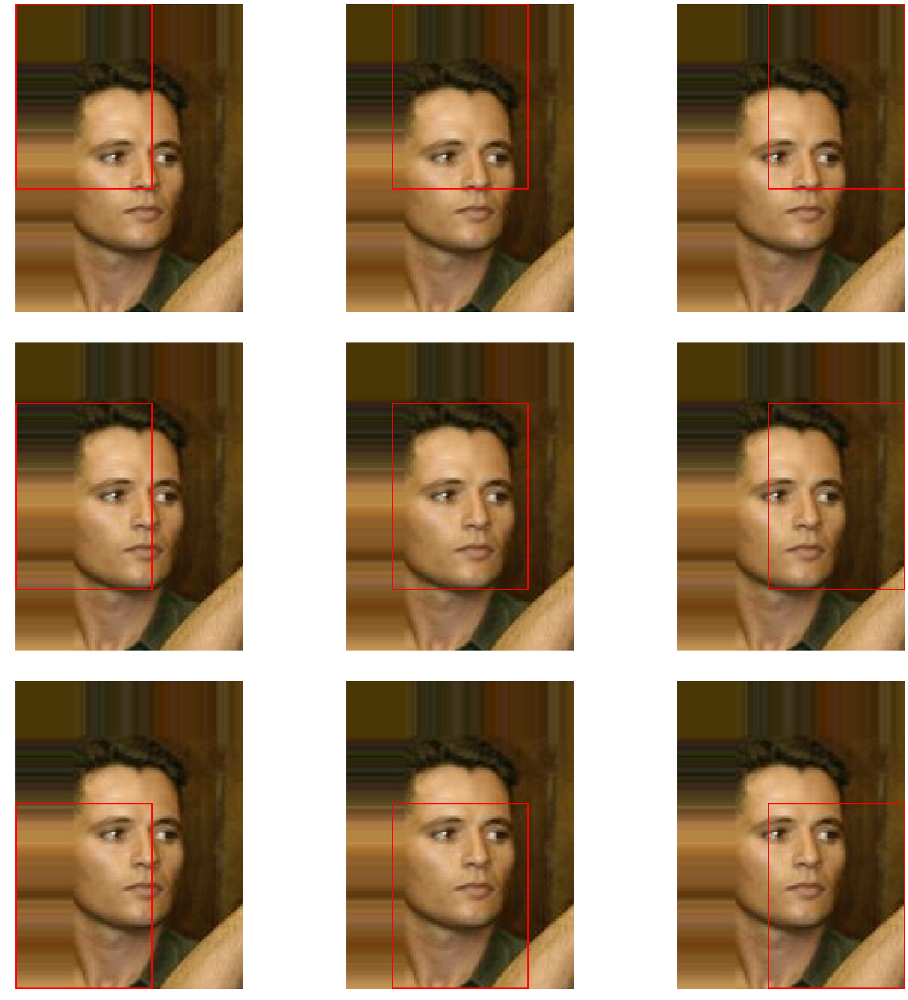

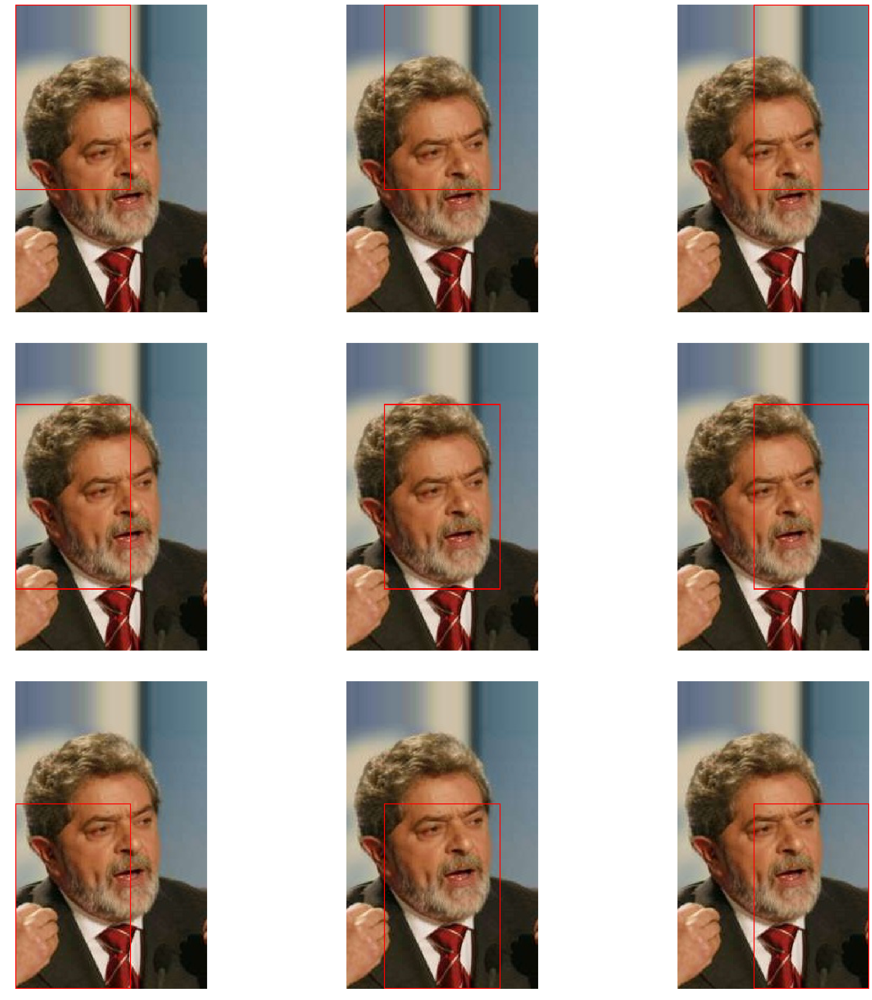

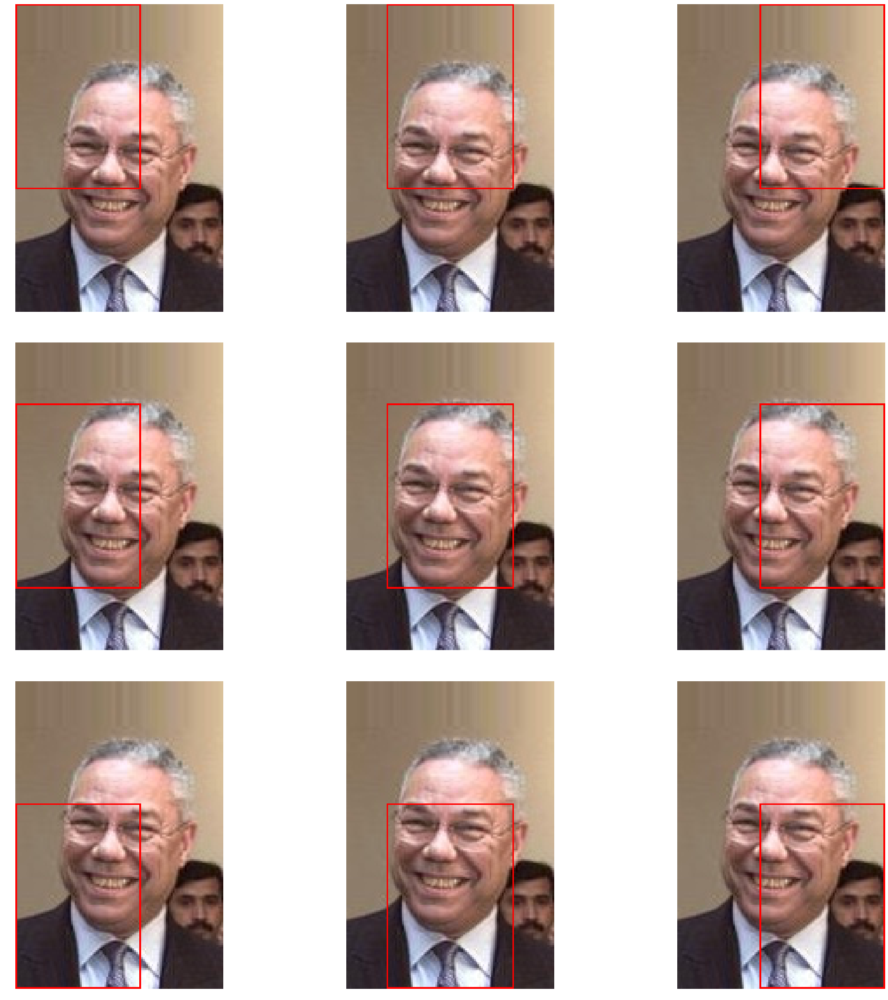

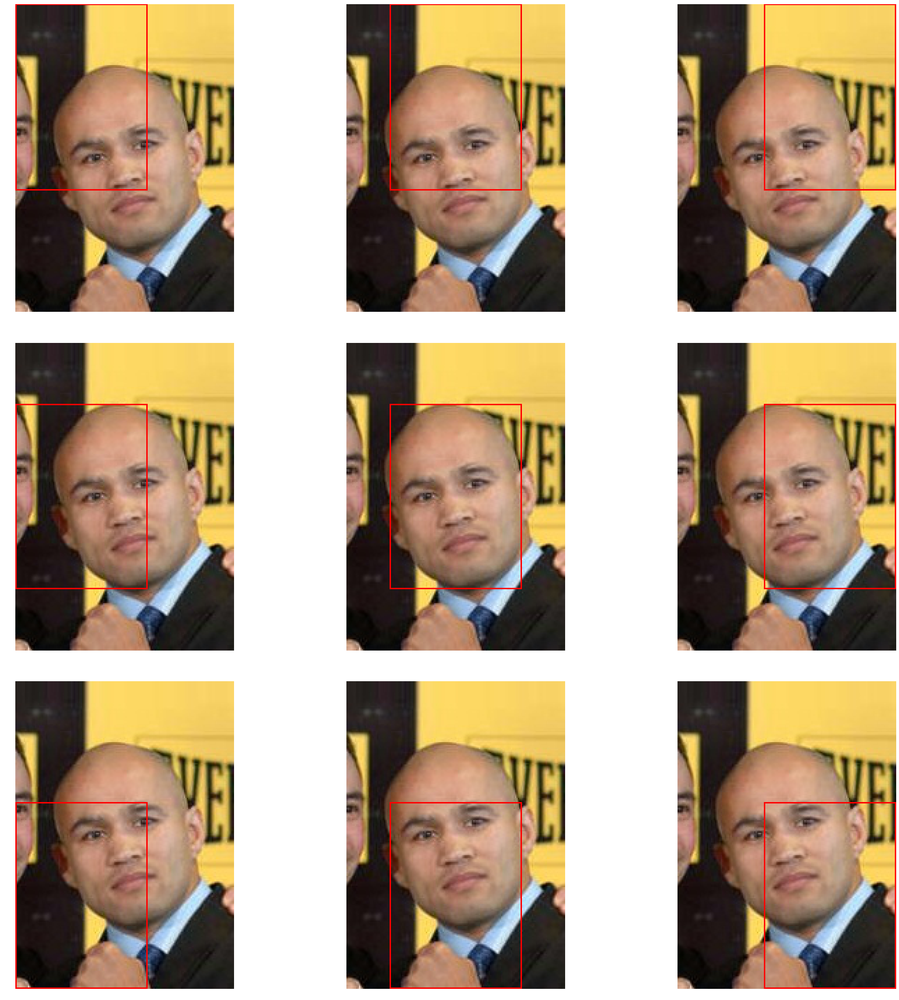

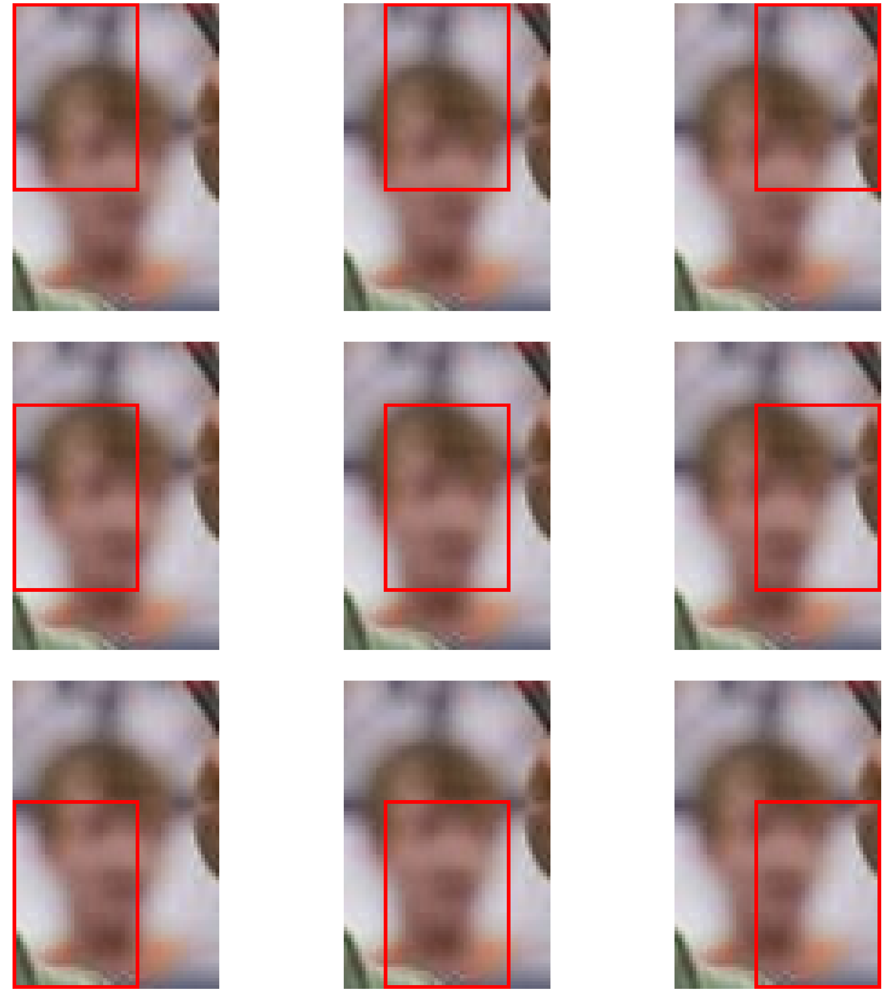

...

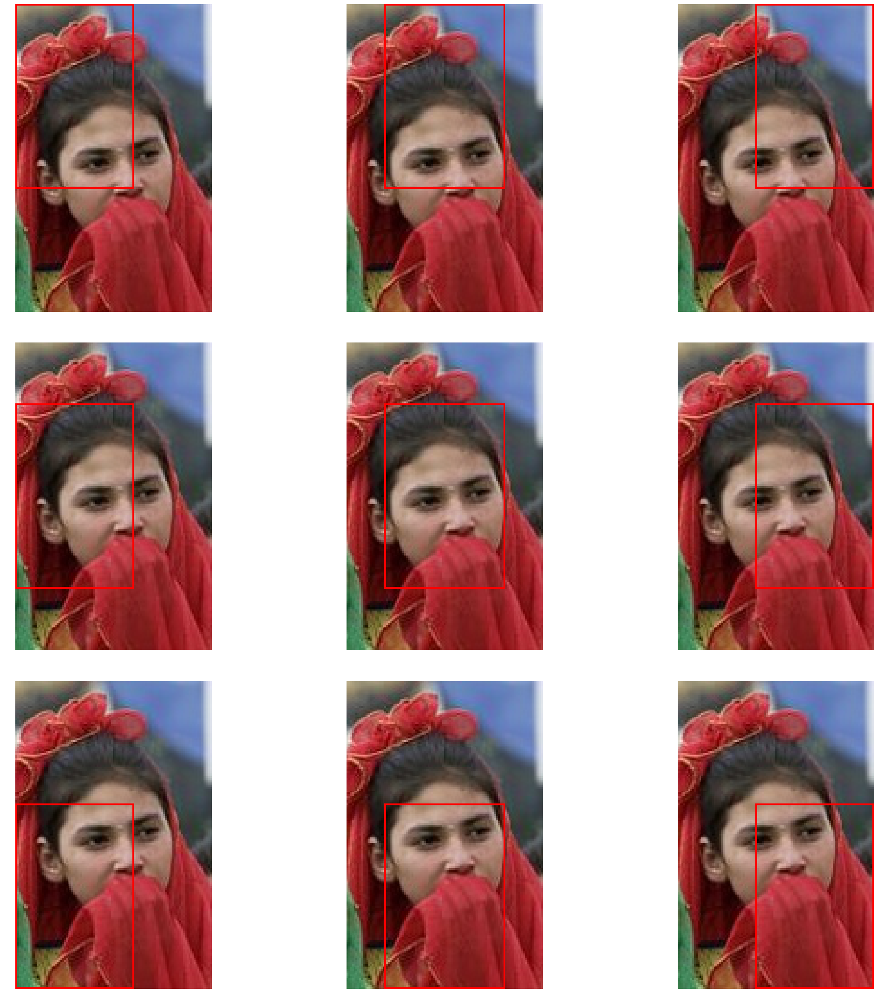

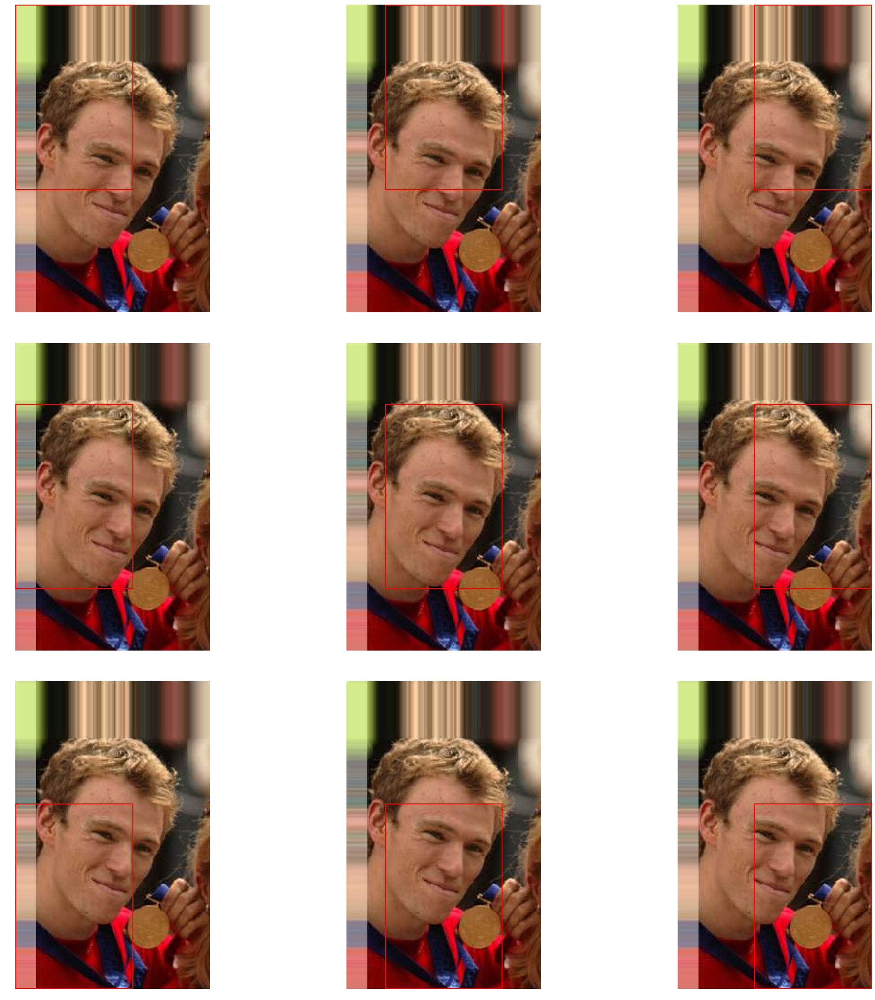

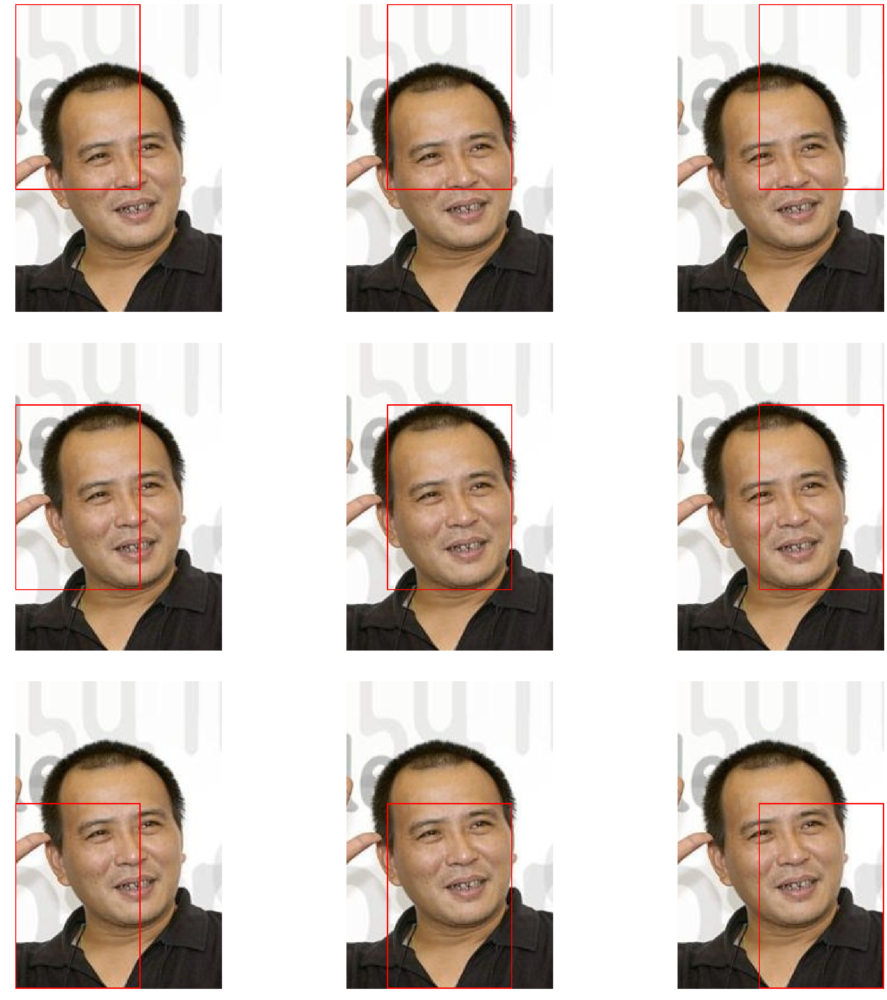

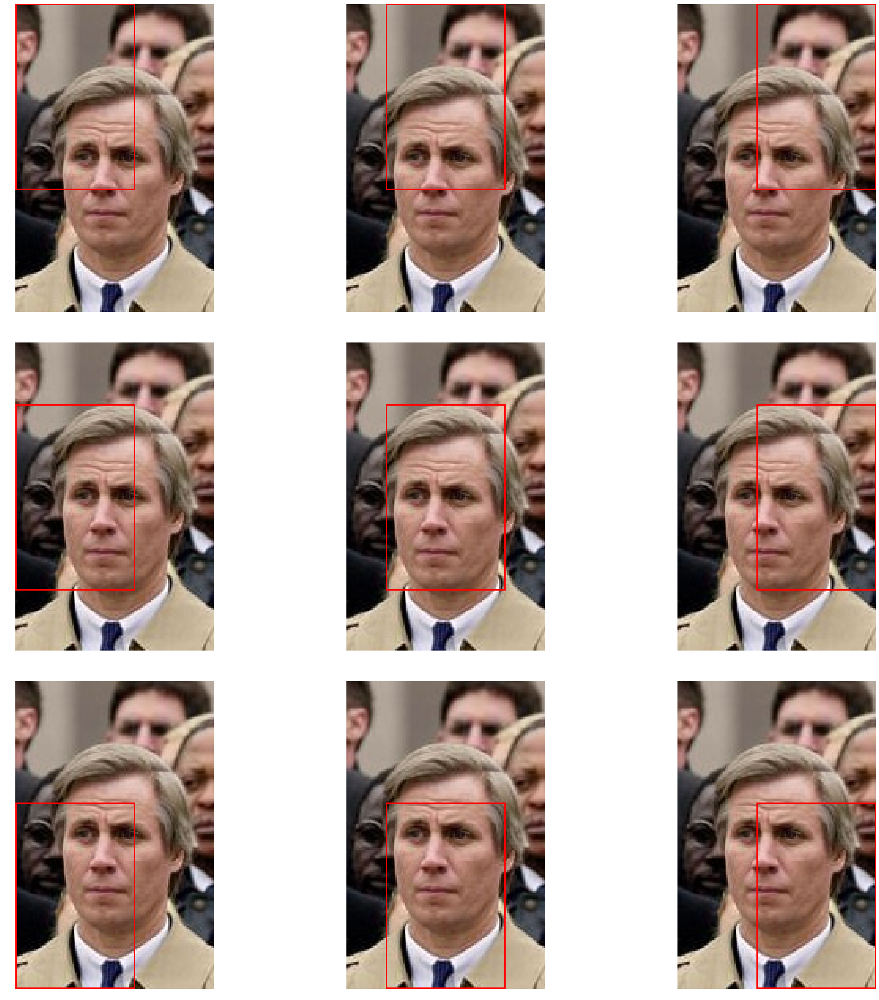

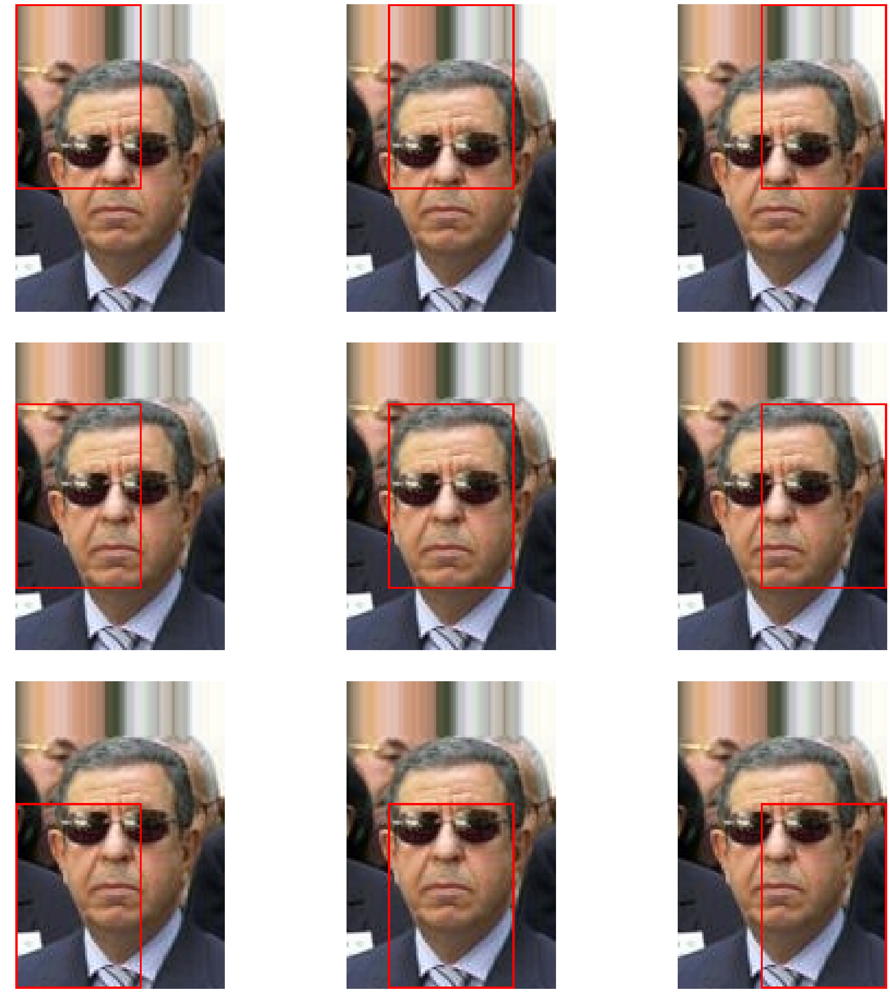

In [29]:
for i in range(50,5000, 233):
    vis(db, i)

## HOG Visualization

Viz are shown [here](./HOG.ipynb)

## PCA & t-SNE

In [33]:
from sklearn import decomposition, manifold
from sklearn import datasets
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [34]:
train_set = torch.load('HOG_train.pt')
val_set = torch.load('HOG_val.pt')
X_train = train_set['hog_feature']
y_train = train_set['label']
X_val = val_set['hog_feature']
y_val = val_set['label']

In [35]:
pos = list(range(1035))
neg = list(range(1035,len(y_val)))

In [36]:
pos_sample = np.random.permutation(pos).tolist()[:500]
neg_sample = np.random.permutation(neg).tolist()[:500]
sampler = np.random.permutation(pos_sample + neg_sample)

In [37]:
X_sub = X_val[:,sampler].reshape(-1,900)
y_sub = y_val[sampler]
y_sub[y_sub==-1] = 0

In [38]:
classes = ['Neg','Pos']

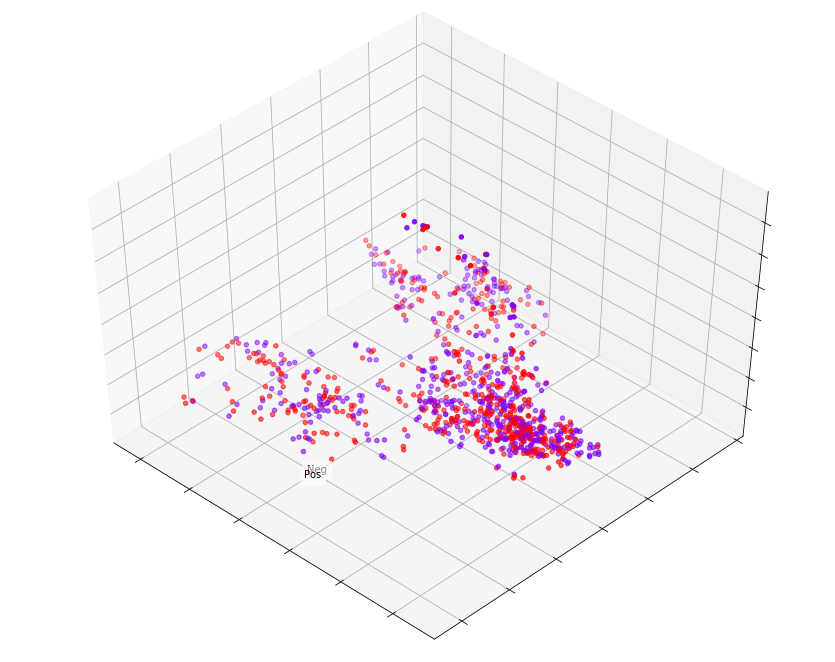

In [43]:
centers = [[1, 1], [-1, -1], [1, -1]]
X = X_sub
y = y_sub.astype(np.float)

fig = plt.figure(1, figsize=(12, 9))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

plt.cla()
pca = decomposition.PCA(n_components=3)
pca.fit(X)
X = pca.transform(X)

for label, name in enumerate(classes):
    ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean() + 1.5,
              X[y == label, 2].mean(), name,
              horizontalalignment='center',
              bbox=dict(alpha=.5, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
# y = np.choose(y, [1, 2, 0]).astype(np.float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, cmap=plt.cm.rainbow,)
#           edgecolor='k')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])

plt.show()

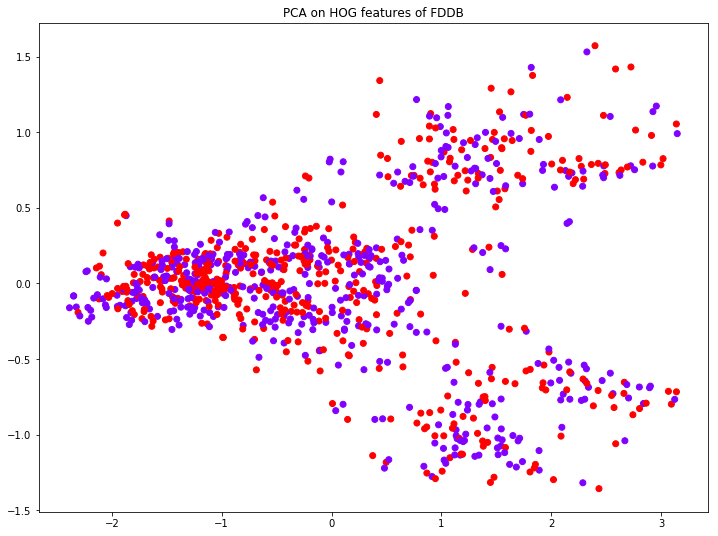

In [44]:
fig = plt.figure(1, figsize=(12, 9))
X = X_sub
y = y_sub.astype(np.float)
pca = decomposition.PCA(n_components=2)
pca.fit(X)
X = pca.transform(X)

# for label, name in enumerate(classes):
# #     ax.text3D(X[y == label, 0].mean(),
# #               X[y == label, 1].mean() + 1.5,
# #               X[y == label, 2].mean(), name,
# #               horizontalalignment='center',
# #               bbox=dict(alpha=.5, edgecolor='w', facecolor='w'))
# # Reorder the labels to have colors matching the cluster results
# # y = np.choose(y, [1, 2, 0]).astype(np.float)
plt.scatter(X[:, 0], X[:, 1],c=y, cmap=plt.cm.rainbow,)
#           edgecolor='k')
plt.title(f'PCA on HOG features of FDDB')
plt.show()

Text(0, 0.5, 'Singular value')

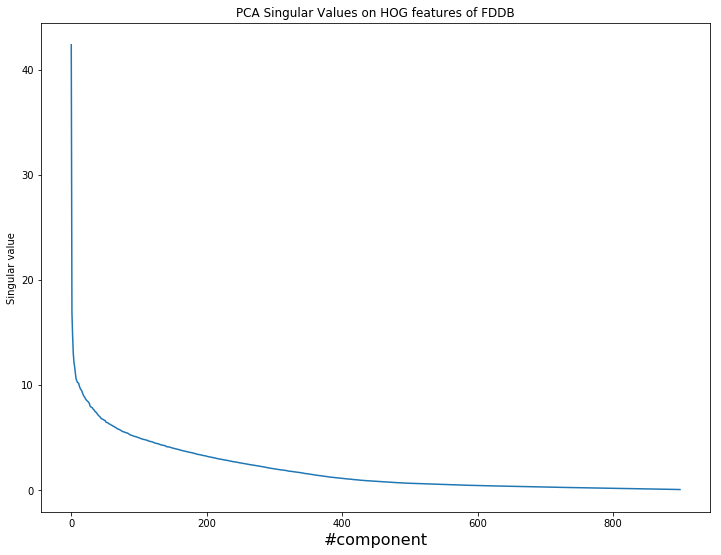

In [45]:
X = X_sub
y = y_sub.astype(np.float)
pca = decomposition.PCA(n_components=900)
pca.fit(X)
X = pca.transform(X)

plt.figure(figsize=(12,9))
plt.plot(pca.singular_values_)
plt.title(f"PCA Singular Values on HOG features of FDDB")
plt.xlabel('#component', size=16)
plt.ylabel('Singular value', size=10)

In [46]:
X_sub.shape

(1000, 900)

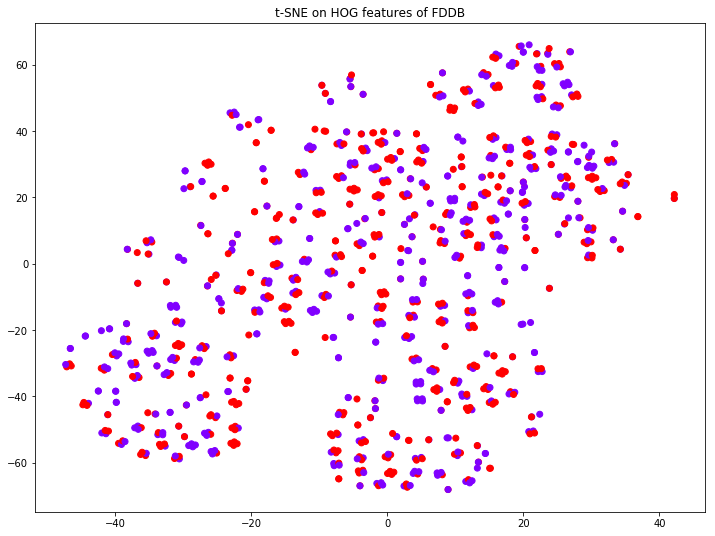

In [47]:
X = X_sub
y = y_sub.astype(np.float)
fig = plt.figure(1, figsize=(12, 9))
tsne = manifold.TSNE(n_components=2, init='random',
                         random_state=0, )
X = tsne.fit_transform(X)
# X = tsne.transform(X)

for label, name in enumerate(classes):
    name = name
#     ax.text3D(X[y == label, 0].mean(),
#               X[y == label, 1].mean() + 1.5,
#               X[y == label, 2].mean(), name,
#               horizontalalignment='center',
#               bbox=dict(alpha=.5, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
# y = np.choose(y, [1, 2, 0]).astype(np.float)
plt.scatter(X[:, 0], X[:, 1],c=y, cmap=plt.cm.rainbow,)
#           edgecolor='k')
plt.title(f't-SNE on HOG features of FDDB')
plt.show()

### CNN

In [48]:
M = Model.CNN({
    'arch': 'resnet18',
    'epochs': 90,
    'optim': 'SGD',
    'save': True
})
db_train = FDDB('train_list.npy', 
                transform=T.Compose([
                    T.RandomHorizontalFlip(),
                    M.img_trans
                ]),
                zero_one=True
               )
db_val = FDDB('val_list.npy', 
              transform=M.img_trans,
              zero_one=True
             )
M.set_dataset(db_train, db_val)
M.load_checkpoint('checkpoint_resnet18_.pth.tar')

=> loading checkpoint 'checkpoint_resnet18_.pth.tar'
=> loaded checkpoint 'checkpoint_resnet18_.pth.tar' (epoch 90) as Teacher!


In [49]:
output_feat_list = []
def hook_forward(module, input, output):
#     output_feat_list = []
#     print(input)
    output_feat_list.append(input[0].data.cpu())
output_feat_hook = M.cnn.fc.register_forward_hook(hook_forward)

In [50]:
features = torch.zeros((len(y_sub), 512))
M.cnn.eval()
preds = []
with torch.no_grad():
    for i in tqdm.tqdm(range(len(sampler))):
        out = M.cnn(db_val[sampler[i]][0].unsqueeze(0).cuda())
        features[i,:] = output_feat_list.pop()[0,:]
        preds.append(out[0].data.cpu())

100%|██████████| 1000/1000 [00:09<00:00, 105.45it/s]


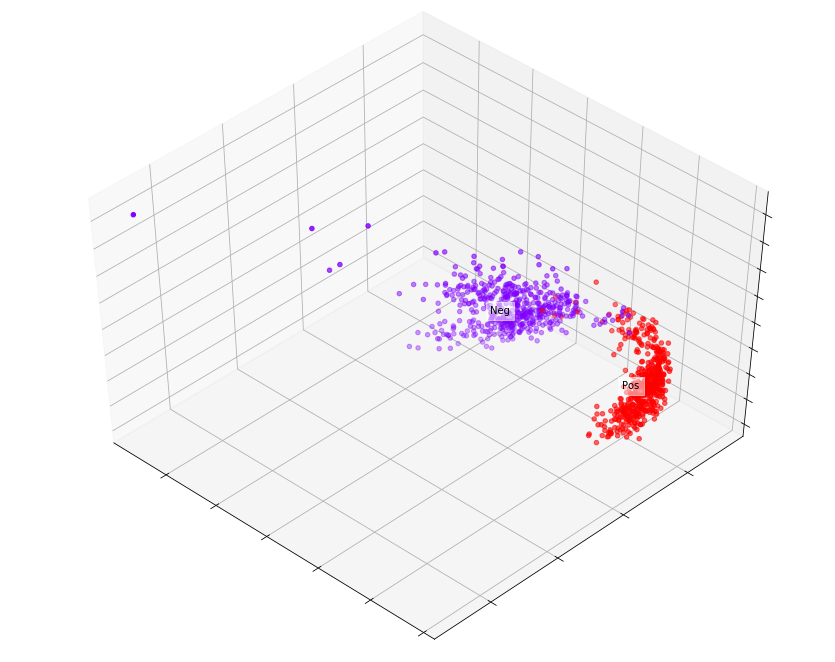

In [51]:
centers = [[1, 1], [-1, -1], [1, -1]]
X = features.numpy()
y = y_sub

fig = plt.figure(1, figsize=(12, 9))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

plt.cla()
pca = decomposition.PCA(n_components=3)
pca.fit(X)
X = pca.transform(X)

for label, name in enumerate(classes):
    name = name
    ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean() + 1.5,
              X[y == label, 2].mean(), name,
              horizontalalignment='center',
              bbox=dict(alpha=.5, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
# y = np.choose(y, [1, 2, 0]).astype(np.float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, cmap=plt.cm.rainbow,)
#            edgecolor='k')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])

plt.show()

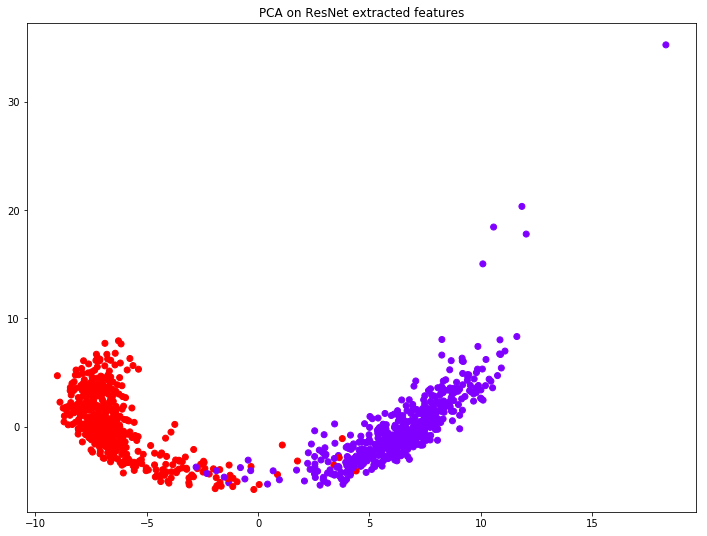

In [53]:
centers = [[1, 1], [-1, -1], [1, -1]]
X = features.numpy()
y = y_sub

fig = plt.figure(1, figsize=(12, 9))
pca = decomposition.PCA(n_components=2)
pca.fit(X)
X = pca.transform(X)

plt.scatter(X[:, 0], X[:, 1],c=y, cmap=plt.cm.rainbow,)
#            edgecolor='k')
plt.title(f'PCA on ResNet extracted features')
plt.show()

Text(0, 0.5, 'Singular value')

<Figure size 864x648 with 0 Axes>

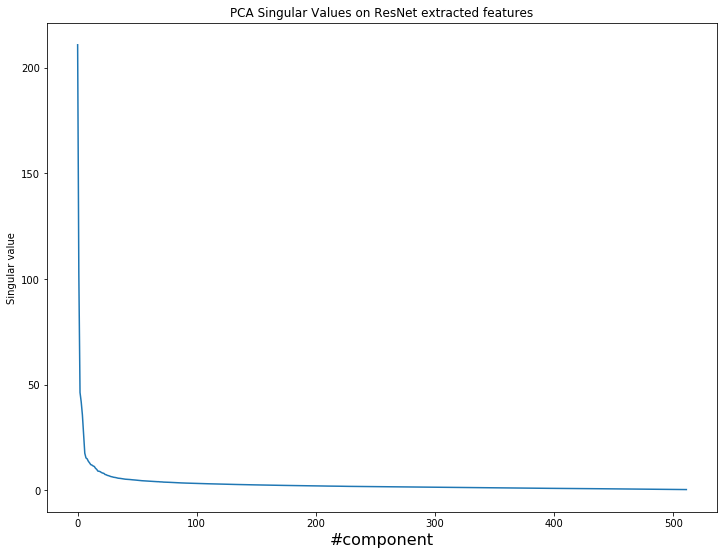

In [54]:
X = features.numpy()
y = y_sub

fig = plt.figure(1, figsize=(12, 9))
pca = decomposition.PCA(n_components=512)
pca.fit(X)

plt.figure(figsize=(12,9))
plt.plot(pca.singular_values_)
plt.title(f"PCA Singular Values on ResNet extracted features")
plt.xlabel('#component', size=16)
plt.ylabel('Singular value', size=10)

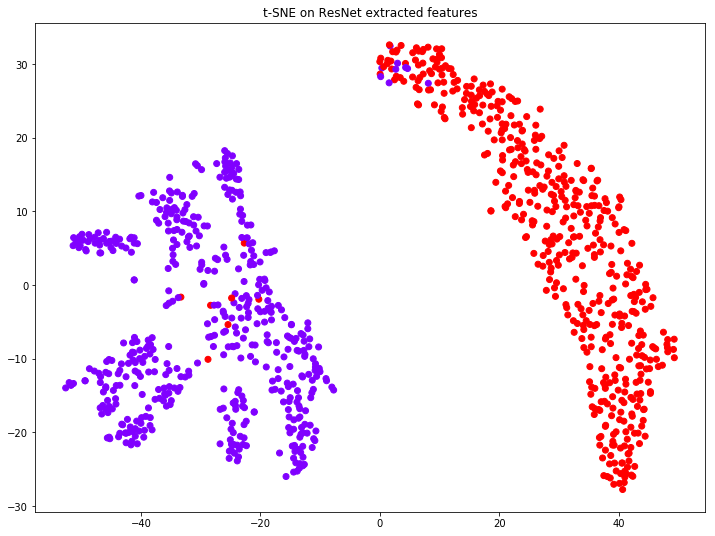

In [56]:
centers = [[1, 1], [-1, -1], [1, -1]]
X = features.numpy()
y = y_sub

fig = plt.figure(1, figsize=(12, 9))
tsne = manifold.TSNE(n_components=2, init='random',
                         random_state=0, )
X = tsne.fit_transform(X)

plt.scatter(X[:, 0], X[:, 1],c=y, cmap=plt.cm.rainbow,)
#            edgecolor='k')
plt.title(f't-SNE on ResNet extracted features')
plt.show()

In [57]:
pwd

'/home/data2/ruofan/MachineLearning/Project1'